In [1]:
import os
from tqdm import tqdm
import random
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from torchinfo import summary

#### Setting up random seeds, device and some constants

In [2]:
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
DATA_DIR = '../data'
RAW_DATA_DIR = os.path.join(DATA_DIR, 'raw')
MODELS_SAVE_DIR = '../models'

In [5]:
IMAGE_SIZE = 64
IMAGE_CHANNELS = 3
BATCH_SIZE = 128
NUM_EPOCHS = 10
LEARNING_RATE = 2e-4
Z_DIM = 100
GEN_FEATURES = 64
DISCR_FEATURES = 64

#### Loading the dataset and visualizing samples

In [8]:
transform = transforms.Compose([transforms.Resize(IMAGE_SIZE),
                                    transforms.CenterCrop(IMAGE_SIZE),
                                    transforms.ToTensor(),
                                    transforms.Normalize([0.5] * IMAGE_CHANNELS, [0.5] * IMAGE_CHANNELS)])

dataset = datasets.ImageFolder(root=DATA_DIR, transform=transform)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=6)

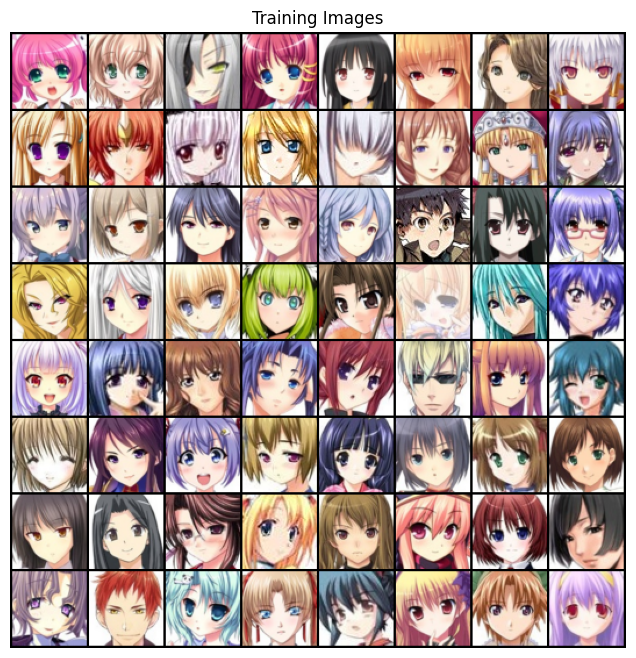

In [7]:
images = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(make_grid(images[0].to(device)[:64], padding=2, normalize=True).cpu(), (1, 2, 0)))
plt.show()

#### Creating parts of the model

In [9]:
class Generator(nn.Module):
    def __init__(self, z_dim, channels, features):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            self._block(z_dim, features * 16, 4, 1, 0),
            self._block(features * 16, features * 8, 4, 2, 1),
            self._block(features * 8, features * 4, 4, 2, 1),
            self._block(features * 4, features * 2, 4, 2, 1),
            nn.ConvTranspose2d(features * 2, channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )
    
    def forward(self, x):
        return self.net(x)

In [10]:
class Discriminator(nn.Module):
    def __init__(self, channels, features):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(channels, features, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            self._block(features, features * 2, 4, 2, 1),
            self._block(features * 2, features * 4, 4, 2, 1),
            self._block(features * 4, features * 8, 4, 2, 1),
            nn.Conv2d(features * 8, 1, kernel_size=4, stride=2, padding=0),
            nn.Sigmoid()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )
    
    def forward(self, x):
        return self.net(x)

#### Initializing the model, loss and optimizer

In [11]:
def init_weights(model):
    classname = model.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

In [12]:
gen = Generator(Z_DIM, IMAGE_CHANNELS, GEN_FEATURES).to(device)
disc = Discriminator(IMAGE_CHANNELS, DISCR_FEATURES).to(device)
init_weights(gen)
init_weights(disc)

In [16]:
summary(gen, input_size=(1, Z_DIM, 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
Generator                                [1, 3, 64, 64]            --
├─Sequential: 1-1                        [1, 3, 64, 64]            --
│    └─Sequential: 2-1                   [1, 1024, 4, 4]           --
│    │    └─ConvTranspose2d: 3-1         [1, 1024, 4, 4]           1,638,400
│    │    └─BatchNorm2d: 3-2             [1, 1024, 4, 4]           2,048
│    │    └─ReLU: 3-3                    [1, 1024, 4, 4]           --
│    └─Sequential: 2-2                   [1, 512, 8, 8]            --
│    │    └─ConvTranspose2d: 3-4         [1, 512, 8, 8]            8,388,608
│    │    └─BatchNorm2d: 3-5             [1, 512, 8, 8]            1,024
│    │    └─ReLU: 3-6                    [1, 512, 8, 8]            --
│    └─Sequential: 2-3                   [1, 256, 16, 16]          --
│    │    └─ConvTranspose2d: 3-7         [1, 256, 16, 16]          2,097,152
│    │    └─BatchNorm2d: 3-8             [1, 256, 16, 16] 

In [17]:
summary(disc, input_size=(1, IMAGE_CHANNELS, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
Discriminator                            [1, 1, 1, 1]              --
├─Sequential: 1-1                        [1, 1, 1, 1]              --
│    └─Conv2d: 2-1                       [1, 64, 32, 32]           3,136
│    └─LeakyReLU: 2-2                    [1, 64, 32, 32]           --
│    └─Sequential: 2-3                   [1, 128, 16, 16]          --
│    │    └─Conv2d: 3-1                  [1, 128, 16, 16]          131,072
│    │    └─BatchNorm2d: 3-2             [1, 128, 16, 16]          256
│    │    └─LeakyReLU: 3-3               [1, 128, 16, 16]          --
│    └─Sequential: 2-4                   [1, 256, 8, 8]            --
│    │    └─Conv2d: 3-4                  [1, 256, 8, 8]            524,288
│    │    └─BatchNorm2d: 3-5             [1, 256, 8, 8]            512
│    │    └─LeakyReLU: 3-6               [1, 256, 8, 8]            --
│    └─Sequential: 2-5                   [1, 512, 4, 4]            --


In [14]:
gen_optim = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
disc_optim = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
criterion = nn.BCELoss()
fixed_noise = torch.randn(64, Z_DIM, 1, 1, device=device)

#### Some utils

In [15]:
def show_tensor_images(images, figsize=(8, 8), title=None):
    img_cpu = images.detach().cpu()
    img_grid = make_grid(img_cpu[:64], padding=2, normalize=True)
    plt.figure(figsize=figsize)
    plt.imshow(img_grid.permute(1, 2, 0).squeeze())
    plt.title(title)
    plt.axis("off")
    plt.show()

def plot_losses(gen_losses, disc_losses):
    plt.figure(figsize=(10, 5))
    plt.plot(gen_losses, label="Generator Loss")
    plt.plot(disc_losses, label="Discriminator Loss")
    plt.legend()
    plt.title("Losses")
    plt.show()

#### Training the model

  0%|          | 0/497 [00:00<?, ?it/s]c:\Users\Vitaliy\anaconda3\envs\main\lib\site-packages\torch\nn\modules\conv.py:952: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ..\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv_transpose2d(
Epoch [1/10]: 100%|██████████| 497/497 [03:25<00:00,  2.41it/s, loss_disc=0.203, loss_gen=3.61] 


Mean Generator Loss: 4.301938245533937, Mean Discriminator Loss: 0.5059105946571835


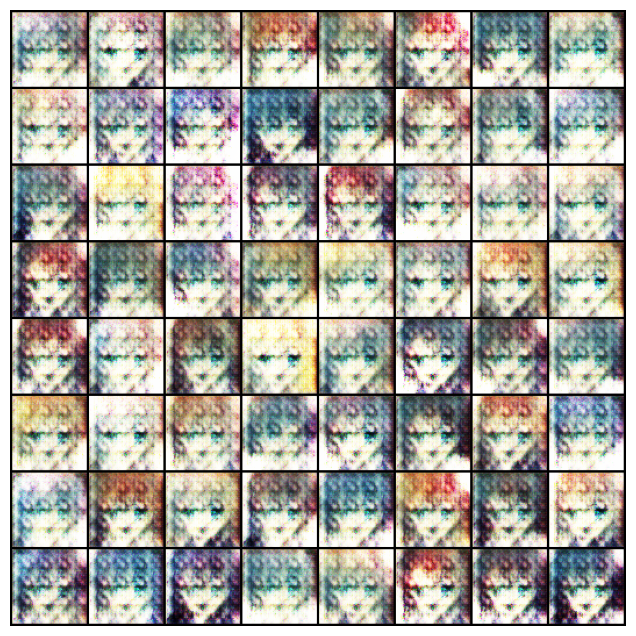

Epoch [2/10]: 100%|██████████| 497/497 [03:22<00:00,  2.46it/s, loss_disc=0.18, loss_gen=2.29]  


Mean Generator Loss: 3.907566797685335, Mean Discriminator Loss: 0.433407988856496


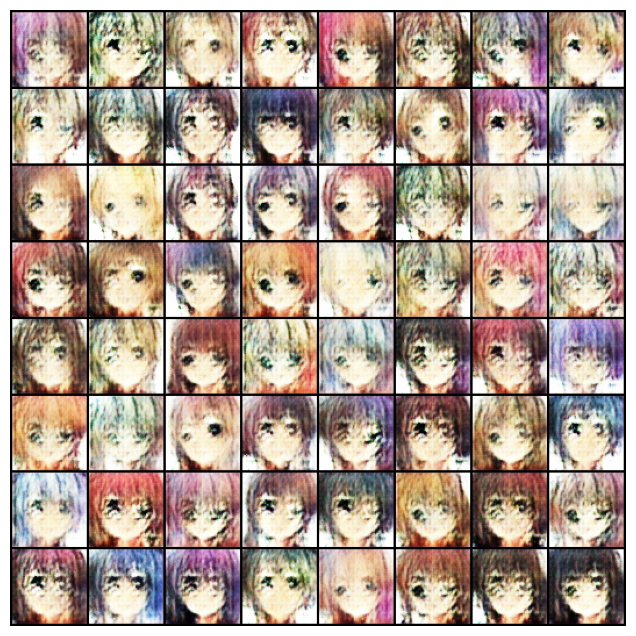

Epoch [3/10]: 100%|██████████| 497/497 [03:23<00:00,  2.44it/s, loss_disc=0.219, loss_gen=4.53] 


Mean Generator Loss: 4.191791202460736, Mean Discriminator Loss: 0.366451292990199


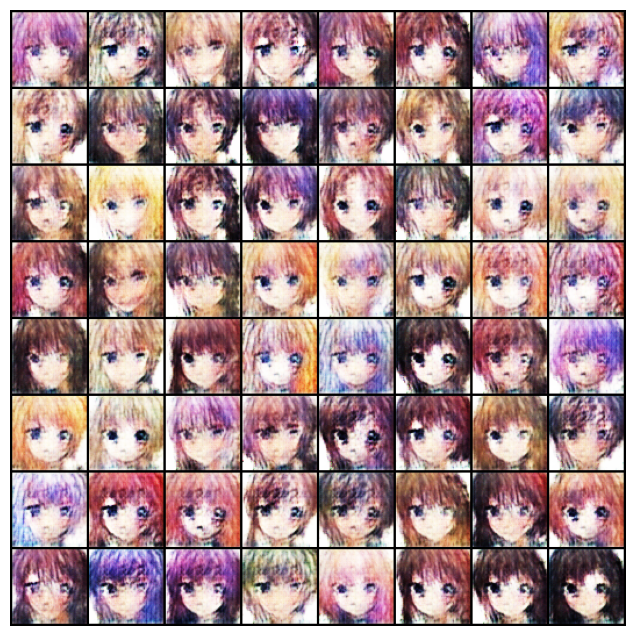

Epoch [4/10]: 100%|██████████| 497/497 [03:23<00:00,  2.44it/s, loss_disc=0.298, loss_gen=3.38] 


Mean Generator Loss: 4.5417062801494446, Mean Discriminator Loss: 0.3209531918407926


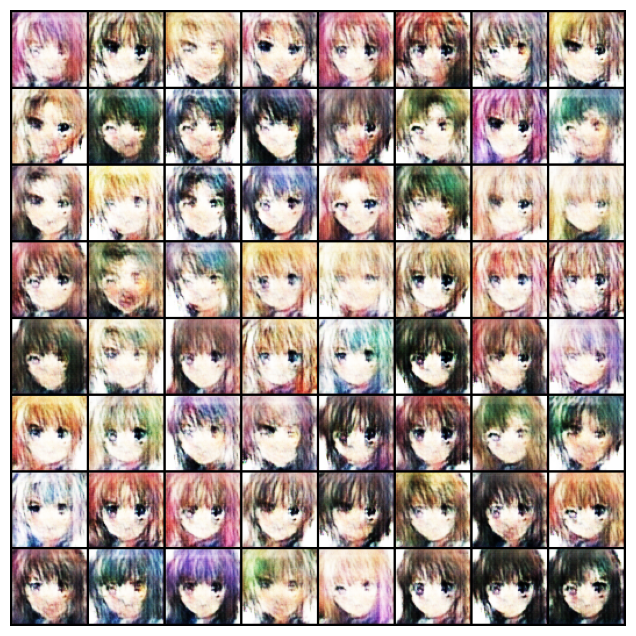

Epoch [5/10]: 100%|██████████| 497/497 [03:23<00:00,  2.45it/s, loss_disc=0.163, loss_gen=1.4]  


Mean Generator Loss: 4.781626557440346, Mean Discriminator Loss: 0.29145571201200215


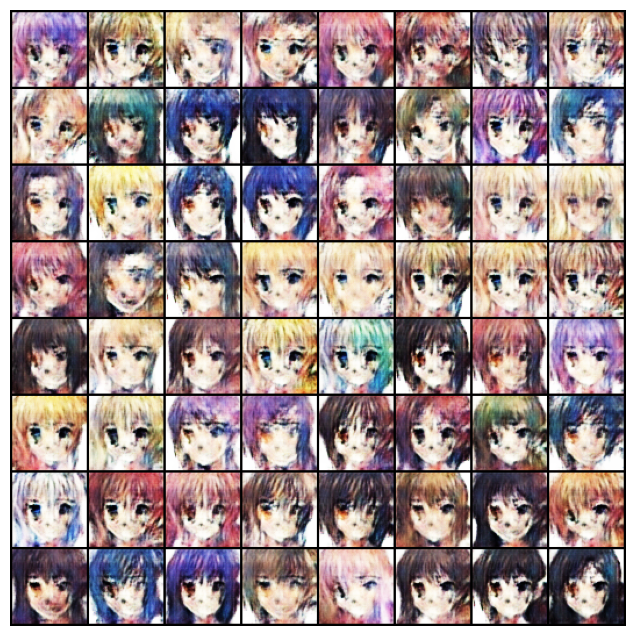

Epoch [6/10]: 100%|██████████| 497/497 [03:22<00:00,  2.46it/s, loss_disc=0.233, loss_gen=5.12] 


Mean Generator Loss: 5.010786787604902, Mean Discriminator Loss: 0.2470934019879376


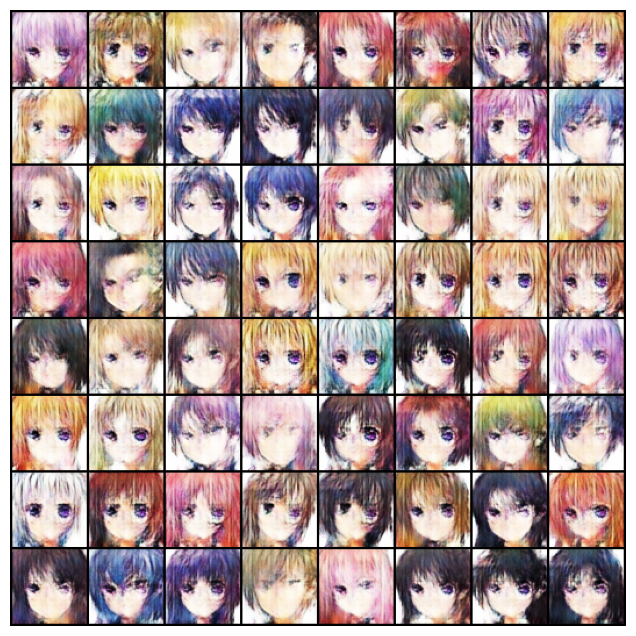

Epoch [7/10]: 100%|██████████| 497/497 [03:21<00:00,  2.47it/s, loss_disc=0.128, loss_gen=3.82] 


Mean Generator Loss: 5.032864169575559, Mean Discriminator Loss: 0.23959222082535866


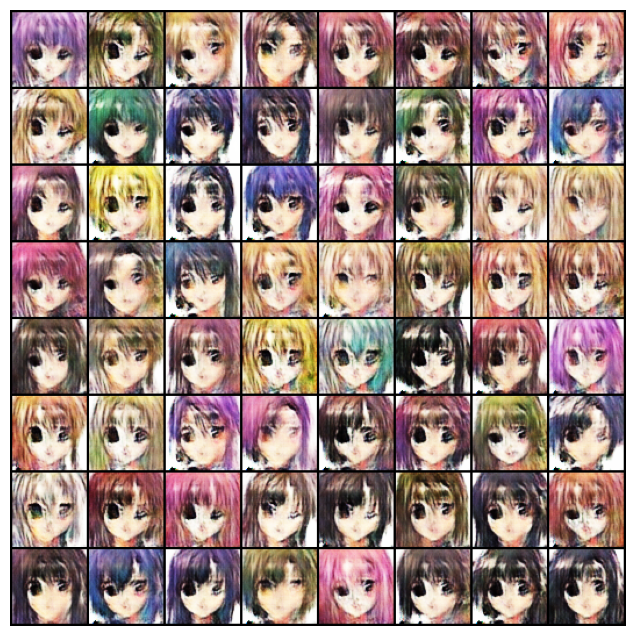

Epoch [8/10]: 100%|██████████| 497/497 [03:26<00:00,  2.41it/s, loss_disc=0.069, loss_gen=3.71] 


Mean Generator Loss: 5.080514532339645, Mean Discriminator Loss: 0.2177520602926522


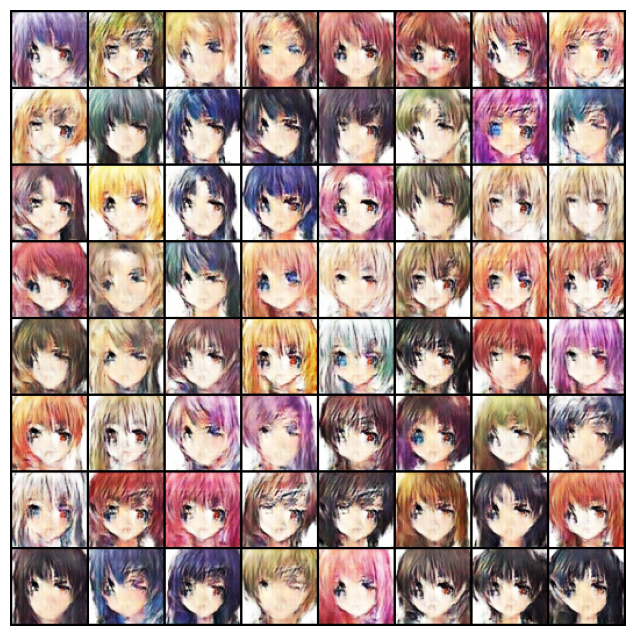

Epoch [9/10]: 100%|██████████| 497/497 [03:29<00:00,  2.38it/s, loss_disc=0.0344, loss_gen=3.89]


Mean Generator Loss: 5.3052057991445185, Mean Discriminator Loss: 0.2084601611551085


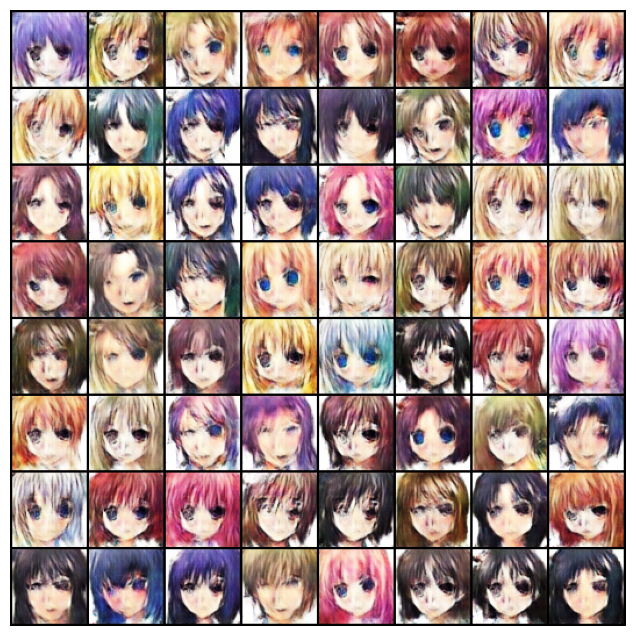

Epoch [10/10]: 100%|██████████| 497/497 [03:26<00:00,  2.40it/s, loss_disc=0.0408, loss_gen=5.49]


Mean Generator Loss: 5.072493411765492, Mean Discriminator Loss: 0.21468254253343197


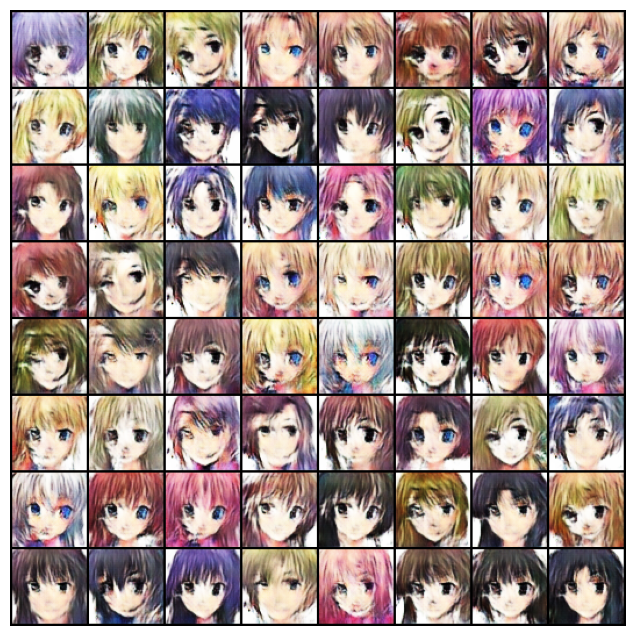

In [16]:
gen_losses = []
disc_losses = []
mean_gen_losses = []
mean_disc_losses = []

for epoch in range(NUM_EPOCHS):
    loop = tqdm(dataloader, leave=True)
    gen.train()
    disc.train()

    for idx, (real, _) in enumerate(loop):
        real = real.to(device)
        noise = torch.randn(BATCH_SIZE, Z_DIM, 1, 1, device=device)
        fake = gen(noise)

        disc.zero_grad()
        disc_real = disc(real).view(-1)
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake.detach()).view(-1)
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        loss_disc = (loss_disc_real + loss_disc_fake) / 2

        loss_disc.backward()
        disc_optim.step()


        gen_optim.zero_grad()
        output = disc(fake).view(-1)
        loss_gen = criterion(output, torch.ones_like(output))
        
        loss_gen.backward()
        gen_optim.step()

        gen_losses.append(loss_gen.item())
        disc_losses.append(loss_disc.item())

        loop.set_description(f"Epoch [{epoch+1}/{NUM_EPOCHS}]")
        loop.set_postfix(loss_disc=loss_disc.item(), loss_gen=loss_gen.item())

    mean_gen_losses.append(np.mean(gen_losses[-len(dataloader):]))
    mean_disc_losses.append(np.mean(disc_losses[-len(dataloader):]))
    print(f"Mean Generator Loss: {mean_gen_losses[-1]}, Mean Discriminator Loss: {mean_disc_losses[-1]}")

    gen.eval()
    with torch.no_grad():
        fake = gen(fixed_noise)
        show_tensor_images(fake)

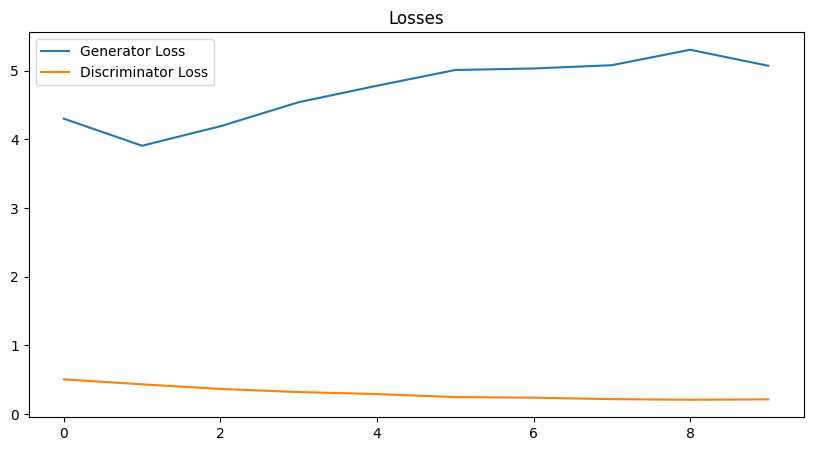

In [17]:
plot_losses(mean_gen_losses, mean_disc_losses)

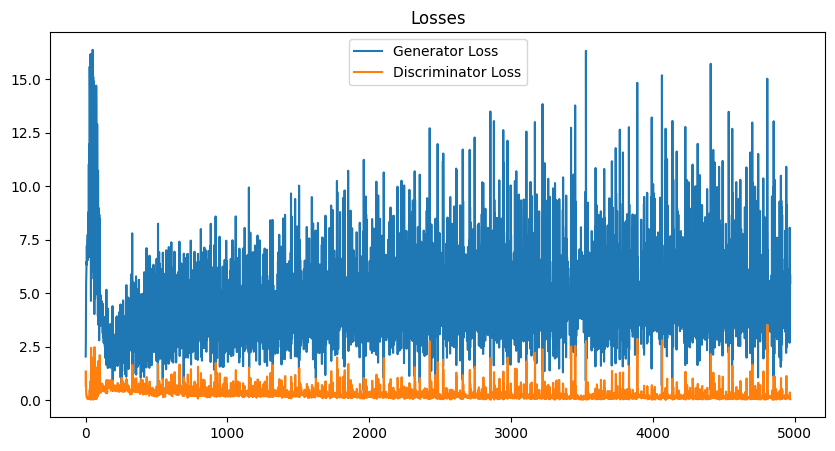

In [18]:
plot_losses(gen_losses, disc_losses)

##### Saving and testing

In [ ]:
torch.save(gen.state_dict(), os.path.join(MODELS_SAVE_DIR, "gen.pth"))
torch.save(disc.state_dict(), os.path.join(MODELS_SAVE_DIR, "discr.pth"))

In [ ]:
gen.load_state_dict(torch.load(os.path.join(MODELS_SAVE_DIR, "gen.pth")))
gen.eval()
gen.to(device)

Generator(
  (net): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (4): ConvTranspose2d(128, 3, 

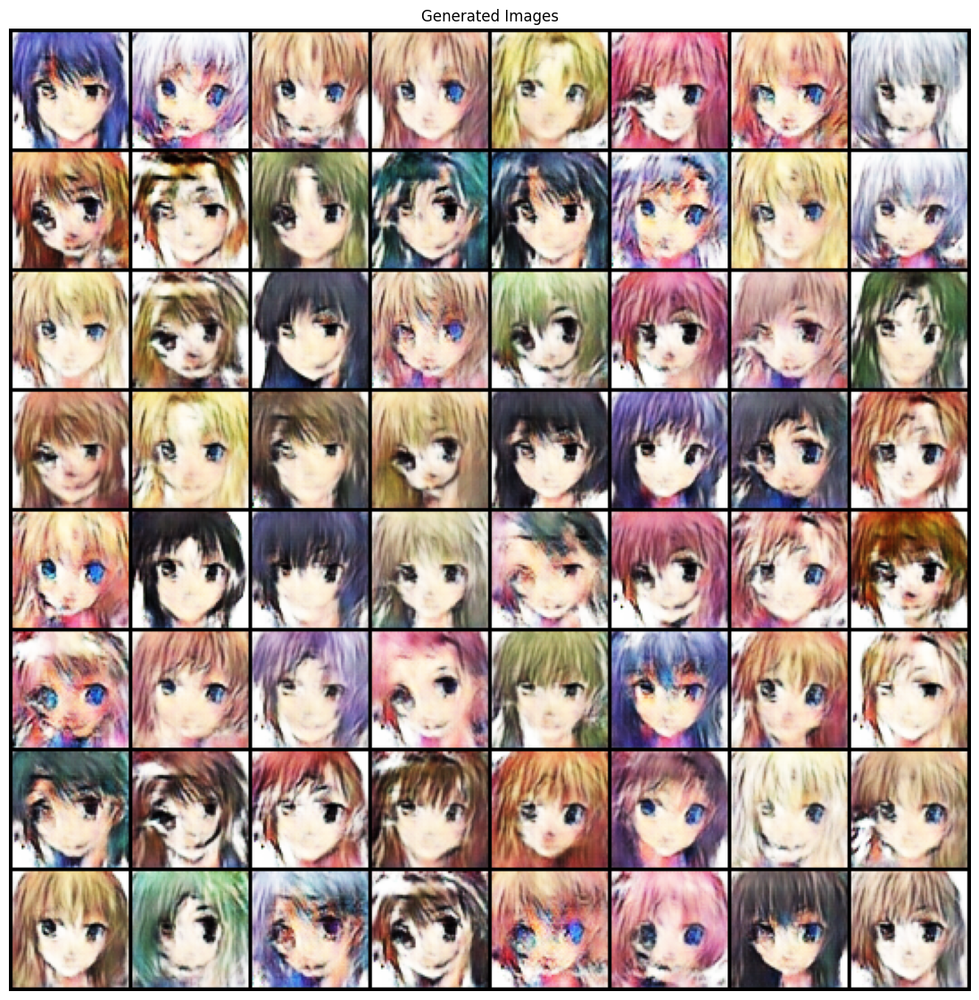

In [ ]:
noise = torch.randn(64, Z_DIM, 1, 1, device=device)
fake = gen(noise)
show_tensor_images(fake, title="Generated Images", figsize=(14, 14))